In [1]:
import spacy
import pandas as pd
import nltk

In [12]:
# import spacy.cli
# spacy.cli.download("en_core_web_lg")

✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_lg')


In [3]:
import en_core_web_sm
nlp = en_core_web_sm.load()

# word embeddings

In [4]:
# One hot encodng

In [2]:
import pandas as pd
from nltk.tokenize import word_tokenize
from sklearn.preprocessing import OneHotEncoder

In [3]:
corpus=["dog bites man","man bites dog"]

s=[]
for doc in corpus:
    tokens=word_tokenize(doc)
    s.extend(tokens)

In [5]:
s

['dog', 'bites', 'man', 'man', 'bites', 'dog']

In [4]:
pd.get_dummies(s)

,bites,dog,man
0,False,True,False
1,True,False,False
2,False,False,True
3,False,False,True
4,True,False,False
5,False,True,False


In [6]:
# problenns

# size increases propotionally with the increases of vocabs
# can't understand obvious reationships between words 

In [8]:
# Using SPacy
# feature vector to express the features thouth which you identify the word 
# and its relation with other words
nlp=spacy.load('en_core_web_lg')
nlp('lion').vector
print(len(nlp('lion').vector))

300


In [9]:
nlp('lion').vector

array([ 1.8963e-01, -4.0309e-01,  3.5350e-01, -4.7907e-01, -4.3311e-01,
        2.3857e-01,  2.6962e-01,  6.4332e-02,  3.0767e-01,  1.3712e+00,
       -3.7582e-01, -2.2713e-01, -3.5657e-01, -2.5355e-01,  1.7543e-02,
        3.3962e-01,  7.4723e-02,  5.1226e-01, -3.9759e-01,  5.1333e-03,
       -3.0929e-01,  4.8911e-02, -1.8610e-01, -4.1702e-01, -8.1639e-01,
       -1.6908e-01, -2.6246e-01, -1.5983e-02,  1.2479e-01, -3.7276e-02,
       -5.7125e-01, -1.6296e-01,  1.2376e-01, -5.5464e-02,  1.3244e-01,
        2.7519e-02,  1.2592e-01, -3.2722e-01, -4.9165e-01, -3.5559e-01,
       -3.0630e-01,  6.1185e-02, -1.6932e-01, -6.2405e-02,  6.5763e-01,
       -2.7925e-01, -3.0450e-03, -2.2400e-02, -2.8015e-01, -2.1975e-01,
       -4.3188e-01,  3.9864e-02, -2.2102e-01, -4.2693e-02,  5.2748e-02,
        2.8726e-01,  1.2315e-01, -2.8662e-02,  7.8294e-02,  4.6754e-01,
       -2.4589e-01, -1.1064e-01,  7.2250e-02, -9.4980e-02, -2.7548e-01,
       -5.4097e-01,  1.2823e-01, -8.2408e-02,  3.1035e-01, -6.33

# Feature extraction methods

## One hot Encoding

### BOW

- represents the occurrences of each in the document,by creating a vocabulary of all the unique words in all documents

we can use countvectorizer function which applies bow

In [14]:
from sklearn.feature_extraction.text import CountVectorizer

In [17]:
cv=CountVectorizer()#stop_words="english"
text="I love playing playstaion"
data=cv.fit_transform([text])
pd.DataFrame(data.toarray(),columns=cv.get_feature_names_out())

,love,playing,playstaion
0,1,1,1


In [18]:
doc1="Data is the oil of the digital economy"
doc2="Data is the new oil"

data=[doc1,doc2]
data=cv.fit_transform(data)
pd.DataFrame(data.toarray(),columns=cv.get_feature_names_out())

,data,digital,economy,is,new,of,oil,the
0,1,1,1,1,0,1,1,2
1,1,0,0,1,1,0,1,1



Disadvantagaes 
- doesn't apply semantic analysis and similarity between words 
- doesn't consider the order of the words in the text,which differ in the meaning

In [20]:
data=["egypt wins senegal","senegal wins egypt"]
data=cv.fit_transform(data)
pd.DataFrame(data.toarray(),columns=cv.get_feature_names_out())

,egypt,senegal,wins
0,1,1,1
1,1,1,1


Additional problems
- High count words dominate ,especially for long docs
- All words treated equally ,where if fact some words are important than others

to solve these problems use TF-IDF vectorizer

# Similarity

In [40]:
# using Spacy
nlp('cat').similarity(nlp('pet'))

0.7505455881628591

In [30]:
# spacy do needed preprocessing for the doc 
nlp('this film is great i love it').similarity(nlp('this film is boring i hate it'))

0.9385479796514673

In [37]:
### here similarity is not good with sentences
# it is lexical not semantic 

# Similarity

- we have 2 kinds of similarity
    1. lexical/text/syntactically similarity
    2. semantic similarity


- lexical similarity 
    - means docs have common/similar words
    - it is not good for sentences for semantic meaning
    - it is important for info retrieval , clustering

## cosine similarity 

##### EX1

In [21]:
from sklearn.feature_extraction.text import CountVectorizer 

In [22]:
doc1="Data is the oil of the digital economy"
doc2="Data is the new oil"

data=[doc1,doc2]

In [23]:
cv=CountVectorizer()#stop_words="english"

data=cv.fit_transform(data)

data.toarray()

array([[1, 1, 1, 1, 0, 1, 1, 2],
       [1, 0, 0, 1, 1, 0, 1, 1]])

In [24]:
tokens=cv.get_feature_names_out()
doc_names=[f'doc_{i+1}' for i,_ in enumerate(data.toarray())]
df=pd.DataFrame(data.toarray(),columns=tokens,index=doc_names)

In [25]:
df

,data,digital,economy,is,new,of,oil,the
doc_1,1,1,1,1,0,1,1,2
doc_2,1,0,0,1,1,0,1,1


In [26]:
df

,data,digital,economy,is,new,of,oil,the
doc_1,1,1,1,1,0,1,1,2
doc_2,1,0,0,1,1,0,1,1


In [29]:
from sklearn.metrics.pairwise import cosine_similarity

In [30]:
simi=cosine_similarity(df)

pd.DataFrame(simi,index=doc_names,columns=doc_names)

,doc_1,doc_2
doc_1,1.000000,0.707107
doc_2,0.707107,1.000000


##### EX2

In [31]:
# Using Spacy
nlp=spacy.load('en_core_web_lg')

In [32]:
nlp(doc1).similarity(nlp(doc2))
# spacy do needed preprocessing fo the doc 

0.9402788281440735

##### EX3

In [33]:
from itertools import combinations

In [34]:
doc1="Data is the oil of the digital economy"
doc2="Data is a new oil"
doc3="science is the true oil"

data=[doc1,doc2,doc3]

In [35]:
pairs=list(combinations(range(len(data)),2))
pairs

[(0, 1), (0, 2), (1, 2)]

In [36]:
data

['Data is the oil of the digital economy',
 'Data is a new oil',
 'science is the true oil']

In [37]:
combos=[(data[i],data[j]) for i,j in pairs]

In [38]:
cv=CountVectorizer(stop_words="english")#stop_words="english"

data=cv.fit_transform(data)

In [39]:
res=[cosine_similarity(data[i],data[j]) for (i,j) in pairs]

In [40]:
sorted(zip(res,combos),reverse=True)

[(array([[0.57735027]]),
  ('Data is the oil of the digital economy', 'Data is a new oil')),
 (array([[0.33333333]]), ('Data is a new oil', 'science is the true oil')),
 (array([[0.28867513]]),
  ('Data is the oil of the digital economy', 'science is the true oil'))]

## Bag of N-grams

In [41]:
from sklearn.feature_extraction.text import CountVectorizer

In [42]:
cv=CountVectorizer(ngram_range=(2,2))

In [43]:
doc1=["Data is the oil of the digital economy"]


In [44]:
x=cv.fit_transform(doc1)

In [45]:
pd.DataFrame(x.toarray(),columns=cv.get_feature_names_out())

,data is,digital economy,is the,of the,oil of,the digital,the oil
0,1,1,1,1,1,1,1


# TF-IDF

In [46]:
# Term Frequency- Inverse Document Frequency

In [47]:
from sklearn.feature_extraction.text import TfidfVectorizer
import pandas as pd

In [48]:
tfidf=TfidfVectorizer(stop_words="english")

In [49]:
d=["the weather is hot under the sun",
   "I make my hot chocolate with milk",
   "one hot encoding",
   "I will have a chai latte with milk",
   "ther is a hot sale today"]
t=tfidf.fit_transform(d)

df=pd.DataFrame(t.toarray(),columns=tfidf.get_feature_names_out())
df

,chai,chocolate,encoding,hot,latte,make,milk,sale,sun,ther,today,weather
0,0.000000,0.000000,0.000000,0.370086,0.000000,0.000000,0.000000,0.000000,0.6569,0.000000,0.000000,0.6569
1,0.000000,0.580423,0.000000,0.327000,0.000000,0.580423,0.468282,0.000000,0.0000,0.000000,0.000000,0.0000
2,0.000000,0.000000,0.871247,0.490845,0.000000,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.0000
3,0.614189,0.000000,0.000000,0.000000,0.614189,0.000000,0.495524,0.000000,0.0000,0.000000,0.000000,0.0000
4,0.000000,0.000000,0.000000,0.309317,0.000000,0.000000,0.000000,0.549036,0.0000,0.549036,0.549036,0.0000


In [50]:
simi=cosine_similarity(df)

doc_names=[f'doc_{i+1}' for i,_ in enumerate(t.toarray())]

pd.DataFrame(simi,columns=doc_names,index=doc_names)

,doc_1,doc_2,doc_3,doc_4,doc_5
doc_1,1.000000,0.121018,0.181655,0.000000,0.114474
doc_2,0.121018,1.000000,0.160507,0.232045,0.101147
doc_3,0.181655,0.160507,1.000000,0.000000,0.151827
doc_4,0.000000,0.232045,0.000000,1.000000,0.000000
doc_5,0.114474,0.101147,0.151827,0.000000,1.000000


In [51]:
from sklearn.feature_extraction.text import CountVectorizer

cv=CountVectorizer(stop_words="english")
data=cv.fit_transform(d)
df=pd.DataFrame(data.toarray(),columns=cv.get_feature_names_out())

In [52]:
simi=cosine_similarity(df)

doc_names=[f'doc_{i+1}' for i,_ in enumerate(data.toarray())]

pd.DataFrame(simi,columns=doc_names,index=doc_names)

,doc_1,doc_2,doc_3,doc_4,doc_5
doc_1,1.000000,0.288675,0.408248,0.000000,0.288675
doc_2,0.288675,1.000000,0.353553,0.288675,0.250000
doc_3,0.408248,0.353553,1.000000,0.000000,0.353553
doc_4,0.000000,0.288675,0.000000,1.000000,0.000000
doc_5,0.288675,0.250000,0.353553,0.000000,1.000000


In [53]:
import spacy

In [54]:
nlp=spacy.load("en_core_web_lg")

In [55]:
from sklearn.metrics.pairwise import cosine_similarity

# Word2Vec

In [56]:
# extract word embedding 
# pca then visualize

In [57]:
# CBOW
# problem:
# cant capture rare words

In [3]:
# skip gram
# can capture rare words
# can capture similarity of word semantics

In [58]:
import gensim

ModuleNotFoundError: No module named 'gensim'

In [5]:
from gensim.models import Word2Vec

In [6]:
from nltk.tokenize import sent_tokenize ,word_tokenize

In [7]:
corpus=["the weather is hot under the sun",
   "I make my hot chocolate with milk",
   "one hot encoding",
   "I will have a chai latte with milk",
   "ther is a hot sale today"]


In [8]:
data=[]
for sent in (corpus):
    temp=[]
    for token in word_tokenize(sent):
        
        temp.append(token.lower())
    data.append(temp)

In [9]:
data

[['the', 'weather', 'is', 'hot', 'under', 'the', 'sun'],
 ['i', 'make', 'my', 'hot', 'chocolate', 'with', 'milk'],
 ['one', 'hot', 'encoding'],
 ['i', 'will', 'have', 'a', 'chai', 'latte', 'with', 'milk'],
 ['ther', 'is', 'a', 'hot', 'sale', 'today']]

In [16]:
model=Word2Vec(data,min_count=1,window=2)

In [17]:
model.wv.get_vector('hot')

array([-5.3553714e-04,  2.3669531e-04,  5.1042321e-03,  9.0087196e-03,
       -9.3021654e-03, -7.1164216e-03,  6.4599523e-03,  8.9738844e-03,
       -5.0149811e-03, -3.7645332e-03,  7.3805200e-03, -1.5343233e-03,
       -4.5381137e-03,  6.5531265e-03, -4.8615444e-03, -1.8159909e-03,
        2.8776852e-03,  9.9226821e-04, -8.2847262e-03, -9.4507886e-03,
        7.3124617e-03,  5.0707972e-03,  6.7586983e-03,  7.6301408e-04,
        6.3493643e-03, -3.4039151e-03, -9.4701635e-04,  5.7699839e-03,
       -7.5225700e-03, -3.9352388e-03, -7.5129503e-03, -9.2965987e-04,
        9.5383720e-03, -7.3214034e-03, -2.3341172e-03, -1.9397530e-03,
        8.0772620e-03, -5.9305434e-03,  4.4470045e-05, -4.7527407e-03,
       -9.6020913e-03,  5.0068516e-03, -8.7602613e-03, -4.3904725e-03,
       -3.3743341e-05, -2.9724432e-04, -7.6616551e-03,  9.6141547e-03,
        4.9831690e-03,  9.2334123e-03, -8.1578307e-03,  4.4962484e-03,
       -4.1348808e-03,  8.2233304e-04,  8.4979506e-03, -4.4629774e-03,
      

In [18]:
model.wv.most_similar('hot')

[('sun', 0.21886225044727325),
 ('encoding', 0.2161378264427185),
 ('chocolate', 0.09315478056669235),
 ('have', 0.09301374107599258),
 ('weather', 0.08403180539608002),
 ('sale', 0.07963650673627853),
 ('today', 0.06437589973211288),
 ('one', 0.06280378252267838),
 ('chai', 0.05433247610926628),
 ('will', 0.027088915929198265)]

In [19]:
model.wv.vectors.shape

(22, 100)

In [20]:
data

[['the', 'weather', 'is', 'hot', 'under', 'the', 'sun'],
 ['i', 'make', 'my', 'hot', 'chocolate', 'with', 'milk'],
 ['one', 'hot', 'encoding'],
 ['i', 'will', 'have', 'a', 'chai', 'latte', 'with', 'milk'],
 ['ther', 'is', 'a', 'hot', 'sale', 'today']]

In [21]:
# already get all unique words embeddings
model.wv.key_to_index

{'hot': 0,
 'with': 1,
 'milk': 2,
 'is': 3,
 'i': 4,
 'the': 5,
 'a': 6,
 'have': 7,
 'will': 8,
 'encoding': 9,
 'one': 10,
 'sale': 11,
 'chocolate': 12,
 'my': 13,
 'make': 14,
 'chai': 15,
 'sun': 16,
 'under': 17,
 'latte': 18,
 'ther': 19,
 'weather': 20,
 'today': 21}

In [151]:
un=[]
for doc in data:
    for word in doc:
        if word not in un:
            un.append(word)

In [154]:
len(un)

22

In [166]:
# Data frame
emb_df=pd.DataFrame(model.wv.vectors,index=model.wv.key_to_index)
emb_df

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
hot,-0.000536,0.000237,0.005104,0.009009,-0.009302,-0.007116,0.006460,0.008974,-0.005015,-0.003765,...,0.001633,0.000189,0.003474,0.000218,0.009619,0.005059,-0.008917,-0.007041,0.000902,0.006394
with,-0.008620,0.003666,0.005190,0.005742,0.007467,-0.006168,0.001106,0.006047,-0.002840,-0.006174,...,0.001088,-0.001576,0.002197,-0.007882,-0.002717,0.002663,0.005347,-0.002392,-0.009510,0.004506
milk,0.000095,0.003080,-0.006812,-0.001380,0.007673,0.007346,-0.003671,0.002645,-0.008316,0.006204,...,-0.004506,0.005702,0.009184,-0.004101,0.007967,0.005375,0.005880,0.000515,0.008214,-0.007018
is,-0.008243,0.009299,-0.000198,-0.001967,0.004604,-0.004095,0.002743,0.006940,0.006065,-0.007511,...,-0.007426,-0.001064,-0.000795,-0.002563,0.009683,-0.000459,0.005874,-0.007448,-0.002506,-0.005550
i,-0.007139,0.001241,-0.007177,-0.002245,0.003719,0.005833,0.001198,0.002103,-0.004110,0.007225,...,0.003137,-0.004713,0.005281,-0.004233,0.002642,-0.008046,0.006210,0.004819,0.000787,0.003013
the,-0.008725,0.002129,-0.000871,-0.009318,-0.009431,-0.001412,0.004434,0.003703,-0.006500,-0.006876,...,0.009072,0.008939,-0.008212,-0.003011,0.009887,0.005106,-0.001589,-0.008695,0.002963,-0.006678
a,0.008132,-0.004457,-0.001068,0.001006,-0.000191,0.001148,0.006114,-0.000020,-0.003246,-0.001511,...,-0.002701,0.000444,-0.003537,-0.000419,-0.000709,0.000823,0.008195,-0.005737,-0.001660,0.005572
have,0.008169,-0.004444,0.008987,0.008255,-0.004436,0.000303,0.004275,-0.003927,-0.005561,-0.006513,...,0.002058,-0.004004,-0.008243,0.006279,-0.001949,-0.000666,-0.001772,-0.004536,0.004062,-0.004271
will,-0.009579,0.008944,0.004166,0.009235,0.006645,0.002925,0.009806,-0.004423,-0.006803,0.004226,...,-0.005084,0.001130,0.002885,-0.001537,0.009934,0.008349,0.002416,0.007119,0.005892,-0.005579
encoding,-0.005156,-0.006668,-0.007777,0.008311,-0.001982,-0.006855,-0.004154,0.005144,-0.002869,-0.003750,...,-0.008977,0.008592,0.004047,0.007470,0.009746,-0.007290,-0.009040,0.005836,0.009391,0.003507


## PCA

In [217]:
from sklearn.decomposition import PCA

In [218]:
pca=PCA(n_components=2,random_state=42)

In [219]:
pca_df=pca.fit_transform(emb_df)

In [220]:
pca_df2=pd.DataFrame(pca_df,columns=['x','y'],index=emb_df.index)
pca_df2

,x,y
hot,-0.027303,0.003214
with,0.017469,0.006719
milk,0.000083,0.018923
is,0.027485,-0.013375
i,0.013409,0.036631
the,0.018999,0.022181
a,-0.007286,0.002745
have,-0.012008,-0.019177
will,0.000972,-0.000225
encoding,-0.025182,-0.000826


In [221]:
import matplotlib.pyplot as plt

C:\Users\mhmed\AppData\Local\Temp\ipykernel_7824\3511534122.py:5: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.
  plt.annotate(str(label),xy=(x,y),textcoords='offset points')


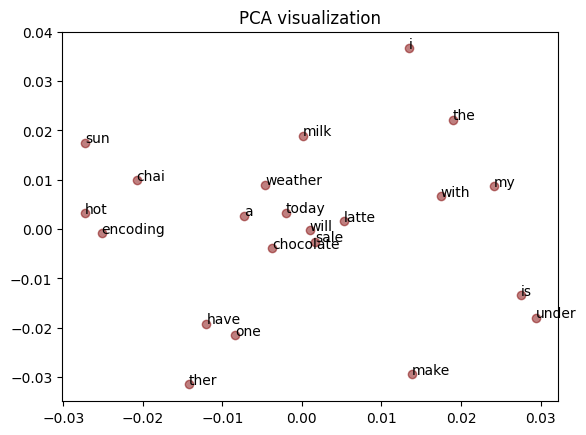

In [227]:
plt.scatter(x=pca_df2['x'],y=pca_df2['y'],color='maroon',alpha=0.5)
plt.title('PCA visualization')
labels=pca_df2.index
for label,x,y in zip(labels,pca_df2['x'],pca_df2['y']):
    plt.annotate(str(label),xy=(x,y),textcoords='offset points')
plt.show()

# Skim Gram

In [241]:
model2=Word2Vec(data,min_count=1,window=2,sg=1)

In [242]:
model2.wv.most_similar('hot')

[('sun', 0.21885839104652405),
 ('encoding', 0.2161683440208435),
 ('have', 0.09301664680242538),
 ('chocolate', 0.09298724681138992),
 ('weather', 0.08405205607414246),
 ('sale', 0.07965177297592163),
 ('today', 0.06434457004070282),
 ('one', 0.06288395822048187),
 ('chai', 0.054339051246643066),
 ('will', 0.02704433538019657)]

In [ ]:
m

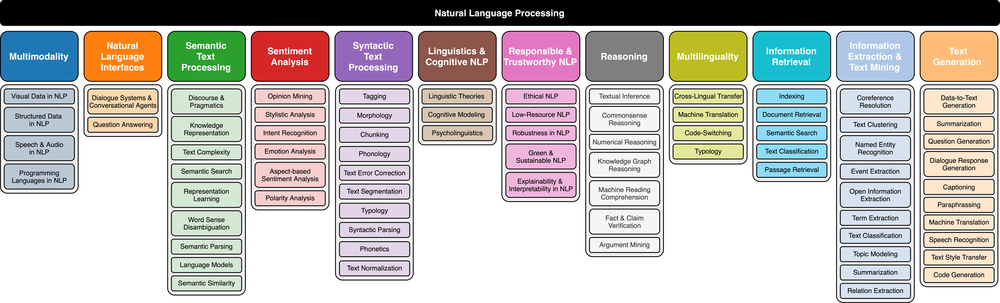

 *****